# Рынок заведений общественного питания Москвы

## Описание проекта

Открытие заведения общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Нужно подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Описание данных

Файл moscow_places.csv:

 - `name` — название заведения;
 - `address` — адрес заведения;
 - `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
 - `hours` — информация о днях и часах работы;
 - `lat` — широта географической точки, в которой находится заведение;
 - `lng` — долгота географической точки, в которой находится заведение;
 - `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
 - `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
 - `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
     - «Средний счёт: 1000–1500 ₽»;
     - «Цена чашки капучино: 130–220 ₽»;
     - «Цена бокала пива: 400–600 ₽» и так далее;
 - `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
     - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
     - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
     - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
 - `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
     - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
     - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
     - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
 - `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
     - 0 — заведение не является сетевым
     - 1 — заведение является сетевым
 - `district` — административный район, в котором находится заведение, например Центральный административный округ;
 - `seats` — количество посадочных мест.

## Общая информация

In [30]:
# библиотеки
import pandas as pd
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import folium
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
import missingno as msno
import json

In [31]:
# открываем файл с данными
data = pd.read_csv('datasets/сatering_market_research.csv')

In [32]:
display(f"В датасете представлено {data['name'].nunique()} заведений.")

'В датасете представлено 5614 заведений.'

In [33]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [34]:
display(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


 - В датасете представлено 5614 заведений.
 - Столбцы сооответствуют предоставленной о них информации в описании к проекту.
 - Тип данных в столбце `seats` - float, что странно, поскольку логично было бы увидеть int.
 - Тип данных в столбце `chain` - int. Согласно описанию в столбце число, выраженное 0 или 1, которое показывает, является ли заведение сетевым. На этапе переработки приведем их к булевым значениям bool.
 - Типы остальных столбцов ожидаемы.

## Предобработка данных

In [35]:
# ищем полные дубликаты
display(f"В датафрейме {len(data[data.duplicated()])} полных дубликатов.")

'В датафрейме 0 полных дубликатов.'

Поищите пропуски: встречаются ли они, в каких столбцах?



<Axes: >

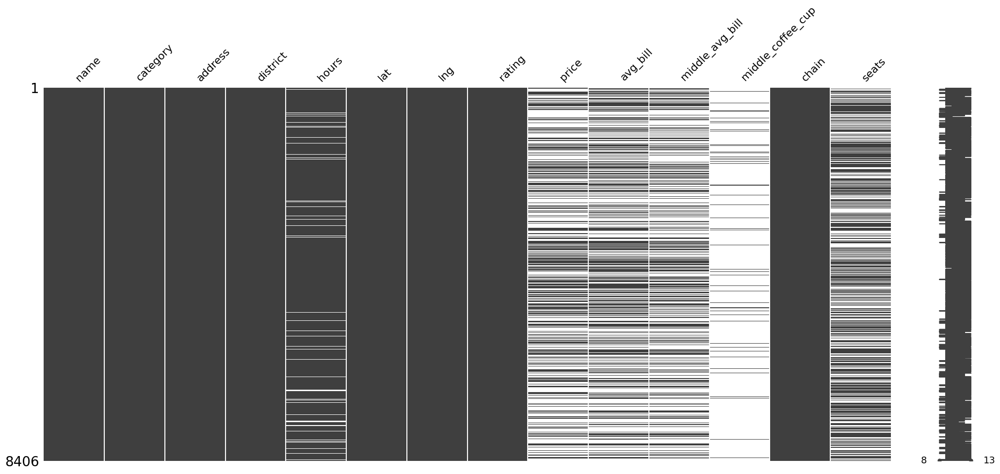

In [36]:
# визуализируем пропуски
msno.matrix(data)

Проверка на неявные дубликаты

In [37]:
# Приведение всех строковых значений к нижнему регистру, кроме столбца "district"
data = data.apply(lambda x: x.str.lower() if x.name != 'district' and x.dtype == "object" else x)


# Удаление пробелов в начале и конце строк
data = data.apply(lambda x: x.str.strip() if x.dtype == "object" else x)

# меняем сокращения на полные слова
data['address'] = data['address'].str.replace('ул.', 'улица', regex=False)
data['address'] = data['address'].str.replace('корп.', 'корпус', regex=False)
data['address'] = data['address'].str.replace('стр.', 'строение', regex=False)


In [38]:
display(data['district'].unique())

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [39]:
display(data['hours'].unique())

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [40]:
# проверяем еще раз
display(f"В датафрейме {len(data[data.duplicated()])} полных дубликатов.")

'В датафрейме 0 полных дубликатов.'

В данных 6 столбцов с пропущеными значениями.

 - cтолбец `hours`


In [41]:
# меняем название столбца на 'opening_hours'
data.rename(columns={'hours': 'opening_hours'}, inplace=True)

# меняем отсутствующие значения в столбце на "не указано"
data['opening_hours'] = data['opening_hours'].fillna('не указано')


 - столбец `price`

In [42]:
display(data['price'].unique())

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [43]:
# меняем название
data.rename(columns={'price': 'price_segment'}, inplace=True)

# меняем отсутствующие значения в столбце на "не указано"
data['price_segment'] = data['price_segment'].fillna('не указано')

 - столбец `avg_bill`

In [44]:
# меняем отсутствующие значения в столбце на "не указано"
data['avg_bill'] = data['avg_bill'].fillna('не указано')

 - столбцы `middle_avg_bill` и `middle_coffee_cup`

In [45]:
data['middle_avg_bill'].count() + data['middle_coffee_cup'].count()

np.int64(3684)

Поскольку пропуски имеют разное происхождение, принимаем решение оставить как есть.

 - столбец `seats`

In [46]:
# проведем небольшую разведку
missing_seats = data.loc[data['seats'].isna(), 'category']

categories_with_missing_seats = missing_seats.unique()

print("Категории заведений, у которых отсутствует информация о количестве посадочных мест:")
print(categories_with_missing_seats)

Категории заведений, у которых отсутствует информация о количестве посадочных мест:
['кафе' 'кофейня' 'пиццерия' 'бар,паб' 'булочная' 'столовая'
 'быстрое питание' 'ресторан']


У меня было предположение, что отсутствующие значения в столбце соответствуют категориям заведений, где посадочных мест не предусмотрено. Но отсутствуют значения во всех категориях, оcтавляю как есть

 - столбец `chain`

In [47]:
# к типу bool
data['chain'] = data['chain'].astype(bool)


 -  столбец `street` с названиями улиц из столбца с адресом



In [48]:
# Функция для извлечения названия улицы из адреса
def extract_street(address):
    # Разбиваем адрес по запятой и удаляем пробелы
    parts = [part.strip() for part in address.split(',')]
    # Извлекаем последний элемент, который должен быть улицей
    street = parts[1]
    return street

# Создаем новый столбец "street" с помощью функции extract_street
data['street'] = data['address'].apply(extract_street)

 - cтолбец `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
     - логическое значение `True` — если заведение работает ежедневно и круглосуточно;
     - логическое значение `False` — в противоположном случае.



In [49]:
# Создаем новый столбец "is_24_7" на основе столбца "opening_hours"
data['is_24_7'] = data['opening_hours'].str.contains('круглосуточно|24/7', case=False)

**Вывод**

In [50]:
# постмотрим, что получилось
display(data)

,name,category,address,district,opening_hours,lat,lng,rating,price_segment,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,не указано,не указано,NaN,NaN,False,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корпус 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,False,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,не указано,цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,True,148.0,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,не указано,не указано,NaN,NaN,False,86.0,профсоюзная улица,False
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корпус 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,не указано,не указано,NaN,NaN,False,150.0,пролетарский проспект,False
8403,самовар,кафе,"москва, люблинская улица, 112а, строение 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,не указано,средний счёт:от 150 ₽,150.0,NaN,False,150.0,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, строение 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,не указано,не указано,NaN,NaN,True,150.0,люблинская улица,True


Данные переработали. 
 - Добавили столбец с булевыми значниями, я вляется ли заведение круглосуточным.
 - Добавили столбец с названиями улиц.
 - Заменили отсутствующие значения где нужно.
 - Привели данные к нужным типам.

## Анализ

### Категории заведений и количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее.

In [51]:
# Посчитаем количество объектов общественного питания по каждой категории
counts = data['category'].value_counts().reset_index()
counts.columns = ['Категория', 'Количество']

# Посчитаем суммарное количество посадочных мест по каждой категории
seats_sum = data.groupby('category')['seats'].sum().reset_index()
seats_sum = seats_sum.sort_values(by='seats', ascending=False)

# Создадим подзаголовки для каждого графика
fig = make_subplots(rows=1, cols=2, subplot_titles=(
    "Количество объектов общественного питания по категориям", "Суммарное количество посадочных мест по категориям"))

# Добавим график для количества объектов общественного питания
fig.add_trace(go.Bar(x=counts['Категория'], y=counts['Количество'],
              text=counts['Количество'], name='Количество объектов'), row=1, col=1)

# Добавим график для суммарного количества посадочных мест
fig.add_trace(go.Bar(x=seats_sum['category'], y=seats_sum['seats'],
              text=seats_sum['seats'], marker_color='brown', name='Количество мест'), row=1, col=2)

# Обновим параметры layout для графиков
fig.update_layout(height=600, width=1400, showlegend=False)

# Покажем графики
fig.show()

**Вывод**

 - Наибольшее количество посадочных мест предоставляют рестораны, что может указывать на их ориентацию на более крупные и длительные посещения, возможно, для проведения обедов и ужинов.
 - Второе место по количеству посадочных мест занимают кафе, что также может указывать на их популярность в качестве места для обедов и перекусов.
 - Кофейни и бары/пабы также имеют значительное количество посадочных мест, что может говорить о популярности этих мест как для отдыха и развлечений, так и для встреч с друзьями и коллегами.
 - Столовые и булочные предлагают наименьшее количество посадочных мест, что, вероятно, связано с их основной функцией как места быстрого питания и/или приобретения продуктов на вынос.

In [52]:
# смотрим медианные значения посадочных мест
median_seats = data.groupby('category')['seats'].median().sort_values(ascending=False)
display(median_seats)

category
ресторан           86.0
бар,паб            82.5
кофейня            80.0
столовая           75.5
быстрое питание    65.0
кафе               60.0
пиццерия           55.0
булочная           50.0
Name: seats, dtype: float64

In [53]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=median_seats.values,
    y=median_seats.index,
    marker=dict(color='orange'),
    orientation='h' 
))

fig.update_layout(
    title='Медианные значения посадочных мест по категориям',
    xaxis_title='Медианное количество мест',
    yaxis_title='Категория',
    yaxis=dict(autorange="reversed") 
)

fig.show()

Из графика видно, что медианное количество посадочных мест в ресторанах, барах, пабах и кофейнях примерно одинаково и находится в диапазоне от 80 до 86 мест. Наименее вместительными оказались булочные, для которых медианное значение посадочных мест составляет 50.

### Cоотношение сетевых и несетевых заведений в датасете

#### Категории заведений чаще всего являющиеся сетевыми

In [54]:
# Посчитаем количество сетевых и несетевых заведений
chain_counts = data['chain'].value_counts().reset_index()
chain_counts.columns = ['chain', 'count']
chain_counts['chain'] = chain_counts['chain'].replace({True: 'Сеть', False: 'Не сеть'})

# Посчитаем количество сетевых и несетевых заведений по категориям
chain_by_category = data.groupby(['category', 'chain']).size().reset_index(name='count')
chain_by_category['chain'] = chain_by_category['chain'].replace({True: 'Сеть', False: 'Не сеть'})
# Создадим визуализацию для соотношения сетевых и несетевых заведений
fig = px.pie(chain_counts, values='count', names='chain', title='Соотношение сетевых и несетевых заведений')
fig.update_traces(textposition='inside', textinfo='percent+label')

# Создадим визуализацию для соотношения сетевых и несетевых заведений по категориям
fig2 = px.bar(chain_by_category, x='category', y='count', color='chain', title='Соотношение сетевых и несетевых заведений по категориям', barmode='group')
fig2.update_layout(xaxis_title='Категория', yaxis_title='Количество заведений', legend_title='Сетевое заведение')
fig2.update_traces(texttemplate='%{y}', textposition='outside')

# Покажем визуализации
fig.show()
fig2.show()


In [55]:
df = data[['category','chain']]
df['chain'] = df['chain'].apply(lambda x: 'несетевое' if x == 0 else 'сетевое')
df_g = df.groupby(['category', 'chain']).size().reset_index()
df_g['percentage'] = df.groupby(['category', 'chain']).size().groupby(level=0).apply(lambda x: 100 * x / float(x.sum())).values
df_g.columns = ['category', 'chain', 'Counts', 'Percentage']
fig = px.bar(df_g, x='category', y='Counts', color='chain', text='Percentage',\
             color_discrete_sequence=['#00cc00', '#ff0000'],\
             labels={
                 "Counts": "Количество заведений",
                 "category": "Название категории",
                 "chain": "сетевое / несетевое",
                 "Percentage": "Процент"
             },
             title="Отношение сетевых к несетевым заведениям по категориям")
fig.update_traces(texttemplate='%{text:.2f}%', textposition='inside')
fig.update_layout(xaxis_title="Название категории", yaxis_title="Количество заведений")
fig.show()

C:\Users\alexei_marganov\AppData\Local\Temp\ipykernel_11752\3160251540.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



**Выводы**

1. **Общее количество заведений:**
   - В датасете представлено 5201 несетевое заведение и 3205 сетевых заведений.

2. **Соотношение сетевых и несетевых заведений:**
   - Несмотря на то, что сетевых заведений меньше по количеству, их доля все равно значительна, составляя примерно 38% от общего числа заведений.
   - Категории заведений, которые становятся сетями: ресторан, кафе, кофейня, пицерия и булочная

3. **Сетевые заведения по категориям:**
   - Большинство баров/пабов, булочных и заведений быстрого питания являются несетевыми.
   - Сетевые заведения чаще встречаются среди кафе, кофеен, пиццерий и ресторанов.
   - Столовые в основном являются несетевыми, но доля сетевых столовых также значительна.

4. **Выводы:**
   - Сетевые заведения чаще встречаются в категориях, где присутствует высокая степень стандартизации и потребность в распространении бренда, таких как кафе, кофейни, пиццерии и рестораны.
   - Столовые и небольшие заведения типа баров/пабов и булочных в основном остаются несетевыми, что может быть связано с их уникальным характером и низкой степенью стандартизации.

### Топ-15 популярных сетей в Москве.

In [56]:
# Сгруппируем данные по названиям сетей и посчитаем количество заведений для каждой сети
chain_counts = data.groupby(['name', 'chain']).size().reset_index(name='count')

# Выберем только сетевые заведения
chain_counts = chain_counts[chain_counts['chain'] == True]

# Найдем топ-15 популярных сетей в Москве
top_15_chains = chain_counts.nlargest(15, 'count')

# Построим визуализацию
fig = px.bar(top_15_chains, x='name', y='count', title='Топ-15 популярных сетей в Москве', labels={'name': 'Название сети', 'count': 'Количество заведений'})
fig.update_layout(xaxis_title='Название сети', yaxis_title='Количество заведений', xaxis={'categoryorder':'total descending'})
fig.update_traces(texttemplate='%{y}', textposition='inside')
fig.show()

In [57]:
# топ 15 с категориями
top15_with_cat = data.query('chain == True').groupby(['name', 'category'])['name'].count().sort_values(ascending=False).to_frame().head(15)
top15_with_cat.columns = ['count']
top15_with_cat = top15_with_cat.reset_index(level=0).reset_index(level=0).sort_values(by='category')

# фрейм с категориями
top_15_category = top15_with_cat.groupby('category')['count'].sum().to_frame().reset_index(level=0)

# Добавление столбца с долями в процентах
top_15_category['percentage'] = ((top_15_category['count'] / top_15_category['count'].sum()) * 100).round(1)

# визуализируем
fig = px.pie(top_15_category, values='percentage', names='category', title='Доля категорий в процентах')
fig.show()


1. **Наиболее распространенные сетевые заведения:**
   - Шоколадница является лидером по количеству заведений в сети (120).
   - Домино'с Пицца и Додо Пицца также имеют значительное количество заведений (76 и 74 соответственно).
   - One Price Coffee и Яндекс Лавка также имеют значительное количество заведений (71 и 69 соответственно).

2. **Среднее количество заведений в сети:**
   - Среднее количество заведений в сети составляет приблизительно 56 (сумма количества заведений в сети, деленная на количество сетевых заведений).

3. **Наиболее распространенные типы сетевых заведений:**
   - Кофейни и пиццерии представлены в числе лидеров с наибольшим количеством заведений в сети.
   - Чайханы и столовые имеют меньшее количество представленных заведений, но все же также встречаются среди сетевых.

4. **Потенциал для развития:**
   - Видно, что кофейные сети, такие как Шоколадница и One Price Coffee, имеют значительное количество заведений. Это может указывать на насыщенность рынка в данном сегменте, но также может быть индикатором популярности кофейни как формата и потенциала для развития новых сетей.
   - Пиццерии также представлены несколькими крупными сетями, что может указывать на высокий спрос на этот вид быстрого питания. Однако, рынок пиццерий также может быть насыщен, и для новых игроков в этой сфере может быть сложно конкурировать с уже установленными брендами.
   - Несетевые заведения также имеют свой потенциал, особенно если у них есть уникальное предложение или концепция, которая может выделить их на рынке.

### Распределение заведений по административным районам

In [29]:
# Группировка данных по районам и категориям, подсчет количества заведений в каждой группе
grouped_data = data.groupby(['district', 'category']).size().unstack(fill_value=0)

# Добавление столбца с общим количеством заведений в каждом районе
grouped_data['total_count'] = grouped_data.sum(axis=1)

# Сброс индексов, чтобы сделать столбец 'district' обычным столбцом
grouped_data = grouped_data.reset_index()

# Преобразование данных в "длинный" формат для Plotly
grouped_data_long = pd.melt(grouped_data, id_vars='district', var_name='category', value_name='count')

# Создание интерактивного горизонтального столбчатого графика с помощью Plotly Express
fig = px.bar(grouped_data_long, y='district', x='count', color='category',
             title='Количество заведений каждой категории по районам',
             labels={'district': 'Район Москвы', 'count': 'Количество заведений', 'category': 'Категория заведений'},
             orientation='h')

# Отображение графика
fig.show()


1. **Распределение объектов общественного питания по типам:**
   - Бары/пабы: Первые пять округов имеют относительно небольшое количество баров и пабов, с наибольшим числом в Центральном административном округе (364). 
   - Булочные: Наибольшее количество булочных также в Центральном административном округе (50), сравнительно меньше в остальных округах.
   - Быстрое питание: Снова Центральный административный округ лидирует (87), но и в других округах это тип заведений популярен.
   - Кафе: Самый популярный тип заведений во всех округах, с наибольшим числом в Центральном административном округе (464).
   - Кофейни: Подобно кафе, они распределены достаточно равномерно, с наибольшим числом в Центральном административном округе (428).
   - Пиццерии: Опять же, большинство находится в Центральном административном округе (113).
   - Рестораны: Снова Центральный административный округ в лидерах (670).
   - Столовые: Распределение похоже на бары/пабы, с большим числом в Центральном административном округе (66).
   
2. **Распределение объектов общественного питания по административным округам:**
   - Наибольшее количество объектов общественного питания в Центральном административном округе (2242), что связано с его центральным местоположением и большим количеством туристических и деловых точек.
   - Далее следуют Южный административный округ (892) и Северный административный округ (900), что может быть связано с их густонаселенностью и развитой инфраструктурой.
   - Наименьшее количество объектов общественного питания в Северо-Западном административном округе (409), что может быть связано с его удаленным положением от центра города и меньшей плотностью населения.

3. **Соотношение количества объектов общественного питания в разных районах одного округа:**
   - В различных районах одного административного округа количество объектов общественного питания может существенно различаться. Например, в Центральном административном округе есть районы с высокой концентрацией (например, центральные районы) и с низкой концентрацией (отдаленные районы).

4. **Потенциальные направления развития:**
   - В Центральном административном округе уже высокая конкуренция, но в других округах ее может быть меньше, что создает возможности для развития бизнеса в этих районах.
   - Исходя из данных, кажется, что в некоторых округах (например, Северо-Западный) может быть нехватка объектов общественного питания, что создает потенциал для открытия новых заведений.
   - Важно также учитывать специфику района и предпочтения его жителей при выборе типа заведения для открытия.

### Распределение средних рейтингов по категориям заведений

In [30]:
# Создание интерактивного ящика с усами для визуализации распределения средних рейтингов по категориям заведений
fig = px.box(data, y='category', x='rating', color='category',
             title='Распределение средних рейтингов по категориям заведений',
             labels={'category': 'Категория заведений', 'rating': 'Средний рейтинг'})

# Отображение графика
fig.update_layout(yaxis={'categoryorder':'total ascending'}) # Для упорядочивания категорий по возрастанию
fig.show()

Усредненные показатели ожидаемо ниже у заведений быстрого питания и кафе. Остальные показатели сильно не разнятся.
Нужно отметить, что сравнивать средние показатели рейтингов в разрезе категорий, не совсем правильно, в силу того, что контингент посетителей разных категорий, скорее всего разный.

### Картограмма со средним рейтингом заведений каждого района

In [58]:
with open('admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
    geo_json = json.load(f)

Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson



In [59]:
# средний рейтинг заведений 
rating_df = data.groupby('district', as_index=False)['rating'].agg('median')

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

#### Все заведения на карте

In [34]:
# Создаем кластер маркеров
marker_cluster = MarkerCluster().add_to(m)

# Добавляем маркеры для каждого заведения
for index, row in data.iterrows():
    popup_text = f"<b>{row['name']}</b><br>{row['address']}"  # Текст, отображаемый при клике на маркер
    folium.Marker([row['lat'], row['lng']], popup=popup_text).add_to(marker_cluster)


In [35]:
# отображаем карту
m

#### Топ-15 улиц по количеству заведений

In [61]:
# топ-15 улиц
top_15_streets = data['street'].value_counts().head(15)
top_15_streets

street
проспект мира             184
профсоюзная улица         122
проспект вернадского      108
ленинский проспект        107
ленинградский проспект     95
дмитровское шоссе          88
каширское шоссе            77
варшавское шоссе           76
ленинградское шоссе        70
мкад                       65
люблинская улица           60
улица вавилова             55
кутузовский проспект       54
улица миклухо-маклая       49
пятницкая улица            48
Name: count, dtype: int64

In [62]:
# Фильтруем данные по топ-15 улицам
top_15_data = data[data['street'].isin(top_15_streets.index)]

# Группируем данные по улицам и категориям, считаем количество заведений
grouped_data = top_15_data.groupby(['street', 'category']).size().unstack(fill_value=0).reset_index()

# Строим диаграмму
fig = px.bar(grouped_data, y='street', x=grouped_data.columns[1:], title='Распределение заведений и их категорий на топ-15 улицах',
             labels={'value': 'Количество заведений', 'street': 'Улица', 'category': 'Категория'},
             barmode='stack')

fig.update_layout(xaxis={'categoryorder': 'total descending'},
                  yaxis_title='Улица', xaxis_title='Количество заведений', legend_title='Категория')

fig.show()

1. **Общее количество заведений на каждой улице:**
    - Максимальное количество заведений: проспект Мира - 166.
    - Минимальное количество заведений: МКАД - 65.
    - В среднем на улице около 25 заведений.

2. **Распределение типов заведений на улицах:**
    - Категория "кафе" является самой популярной на большинстве улиц.
    - Проспект Мира имеет самое большое количество заведений во всех категориях.
    - Кутузовский проспект и МКАД имеют наименьшее количество заведений во всех категориях.

3. **Наиболее популярные типы заведений:**
    - Кафе - самый популярный тип заведения на большинстве улиц.
    - Рестораны и пиццерии также достаточно популярны на многих улицах.
    - Бары и пабы чаще всего встречаются на проспекте Мира.

4. **Потенциальные рыночные ниши:**
    - Улицы с наименьшим количеством заведений (например, МКАД) могут представлять собой потенциальные рыночные ниши для открытия новых заведений определенного типа, особенно тех, которые пользуются популярностью на других улицах, но отсутствуют на этой улице.

#### Улицы, на которых находится только один объект общепита.

In [63]:
# Подсчитываем количество объектов общепита на каждой улице
street_counts = data['street'].value_counts()

# Выбираем улицы, где количество объектов равно 1
streets_with_single_object = street_counts[street_counts == 1].index

# Отбираем только строки с улицами, на которых один объект общепита
single_object_data = data[data['street'].isin(streets_with_single_object)]

# Выводим нужные столбцы (улица, категория заведения)
result_table = single_object_data[['street', 'category']]

# Подсчитываем количество заведений каждой категории на улицах с одним объектом общепита
category_counts = result_table['category'].value_counts()

# Подсчитываем количество улиц с одним объектом общепита в каждом районе
streets_by_district = single_object_data['district'].value_counts()

display(f"Количество улиц с одним заведением {len(result_table)}")
display(streets_by_district)
display(category_counts)


'Количество улиц с одним заведением 457'

district
Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             51
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: count, dtype: int64

category
кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: count, dtype: int64

В разных административных округах города распределение улиц с одним объектом общепита неоднородно. Кроме того, на улицах с одним заведением преобладают категории заведений, такие как кафе, рестораны и кофейни.

### Цены и средние чеки.

Значения средних чеков заведений хранятся в столбце `middle_avg_bill`. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. 

Целесообразно посчитать медиану этого столбца для каждого района и использовать это значение в качестве ценового индикатора района. 

In [64]:
# Подсчитываем медиану столбца middle_avg_bill для каждого района
median_price_by_district = data.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False)

# Выводим результат
display(median_price_by_district)

district
Западный административный округ            1000.0
Центральный административный округ         1000.0
Северо-Западный административный округ      700.0
Северный административный округ             650.0
Юго-Западный административный округ         600.0
Восточный административный округ            575.0
Северо-Восточный административный округ     500.0
Южный административный округ                500.0
Юго-Восточный административный округ        450.0
Name: middle_avg_bill, dtype: float64

In [65]:
m = folium.Map(location=[55.7558, 37.6173], zoom_start=10)

# Добавляем геометрию районов с данными о медиане стоимости заказа
folium.Choropleth(
    geo_data=geo_json,
    data=median_price_by_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Median Order Cost'
).add_to(m)

# Отображаем карту
m



1. Судя по данным, средние цены выше в центре Москвы. Например, средние цены в Центральном административном округе (ЦАО) и Западном административном округе (ЗАО) составляют 1000 рублей, что является наивысшим показателем среди всех районов.

2. Однако средняя цена и удалённость от центра не всегда коррелируют. Например, в районе Внуково и на Новой Риге цены также достигают уровня ЦАО (1000 рублей), несмотря на то, что эти районы находятся за пределами центральной части города.

3. В других районах, таких как Восточный административный округ (ВАО), Северный административный округ (САО) и Северо-Западный административный округ (СЗАО), средние цены также выше среднего (575, 650 и 700 рублей соответственно), что может свидетельствовать о спросе на общепит в этих районах.

Таким образом, можно сделать вывод о том, что хотя центр города имеет высокие цены, но также есть районы за его пределами, где цены также находятся на высоком уровне, возможно, из-за специфических характеристик района или высокого спроса на услуги общепита.

## Общий вывод

1. **Распределение заведений по типам:**
   - Кафе являются наиболее распространенным типом заведений на улицах Москвы, что указывает на их популярность среди посетителей. Это подтверждается как общим анализом по всем районам города, так и анализом сетевых заведений, где кафе также занимают лидирующее положение.
   - Рестораны и пиццерии также широко представлены на улицах Москвы, что говорит о высоком спросе на разнообразные варианты общественного питания в городе.

2. **Распределение заведений по административным округам:**
   - Центральный административный округ является наиболее насыщенным с точки зрения количества объектов общественного питания. Это связано с его центральным местоположением, большим количеством туристических и деловых точек, а также высокой плотностью населения.
   - Другие округа, такие как Южный, Северный и Восточный административные округа, также представлены значительным количеством заведений, что может указывать на их густонаселенность и развитую инфраструктуру.

3. **Динамика цен:**
   - В центральных районах города средние цены на обслуживание могут быть выше, однако они не всегда являются самыми высокими. Это указывает на наличие других факторов, влияющих на формирование цен, таких как престижность района, качество обслуживания и уровень спроса.
   - В некоторых удаленных районах, таких как Внуково и Новая Рига, цены также могут достигать уровня центральных районов, что может быть связано с престижностью и спецификой потребительского спроса в этих районах.

4. **Потенциальные рыночные ниши:**
   - Районы с низкой концентрацией заведений, такие как МКАД или некоторые отдаленные районы, могут представлять потенциальные рыночные ниши для открытия новых заведений, особенно востребованных форматов, которые пользуются успехом в других районах города.
   - Понимание специфики района и потребностей его жителей может помочь предпринимателям и бизнес-аналитикам определить оптимальное направление для развития бизнеса в конкретном районе Москвы.

## Детализация исследования: открытие кофейни

 - Количество кофеен в датасете.
 - Особенности их расположения. 
 - Есть ли круглосуточные кофейни.
 - Рейтинги.
 - Средняя стоимость чашки кофе.

In [66]:
# Считаем кофейни
display(f"Общее количество кофеен в датасете: {data[data['category'] == 'кофейня'].shape[0]}")

# Считаем круглосуточные кофейни
display(f"Количество круглосуточных кофеен: {data[data['category'] == 'кофейня']['is_24_7'].sum()}")

# Определение районов с наибольшим количеством кофеен
coffee_shops_by_district = data[data['category'] == 'кофейня']['district'].value_counts()
display("Распределение кофеен по районам:", coffee_shops_by_district)

# Распределение рейтингов кофеен по районам
ratings_by_district = data[data['category'] == 'кофейня'].groupby('district')['rating'].mean()
display("Распределение среднего рейтинга кофеен по районам:\n", ratings_by_district)

'Общее количество кофеен в датасете: 1413'

'Количество круглосуточных кофеен: 76'

'Распределение кофеен по районам:'

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: count, dtype: int64

'Распределение среднего рейтинга кофеен по районам:\n'

district
Восточный административный округ           4.282857
Западный административный округ            4.195333
Северный административный округ            4.291710
Северо-Восточный административный округ    4.216981
Северо-Западный административный округ     4.325806
Центральный административный округ         4.336449
Юго-Восточный административный округ       4.225843
Юго-Западный административный округ        4.283333
Южный административный округ               4.232824
Name: rating, dtype: float64

In [69]:
avg_coffee = data.query('category == "кофейня"')\
.pivot_table(index='district', values='middle_coffee_cup', aggfunc=['mean','count']).reset_index()
avg_coffee.columns = ['district', 'mean_bill', 'count']
avg_coffee = avg_coffee.sort_values(by='mean_bill', ascending=False)

# Создаем данные для графика
trace1 = go.Bar(
    x=avg_coffee['district'],
    y=avg_coffee['mean_bill'],
    name='Средний счет',
    marker=dict(color='rgb(158,202,225)')
)
trace2 = go.Bar(
    x=avg_coffee['district'],
    y=avg_coffee['count'],
    name='Количество кофеен',
    marker=dict(color='rgb(58,200,225)')
)

# Создаем компоновку графика
layout = go.Layout(
    title='Средний счет и количество кофеен по округам',
    xaxis=dict(title='Округ'),
    yaxis=dict(title='Средний счет и количество кофеен'),
    barmode='group'
)

# Создаем объект фигуры и отображаем его
fig = go.Figure(data=[trace1, trace2], layout=layout)
fig.show()


In [70]:
coffee_data = data[data['category'] == 'кофейня']

marker_cluster = MarkerCluster().add_to(m)

# Добавляем маркеры для каждой кофейни
for index, row in coffee_data.iterrows():
    popup_text = f"<b>{row['name']}</b><br>{row['address']}"  # Текст, отображаемый при клике на маркер
    folium.Marker([row['lat'], row['lng']], popup=popup_text).add_to(marker_cluster)

m

**Вывод**

Центральный административный округ выделяется как зона с наибольшей концентрацией кофейных заведений, при этом их количество значительно превосходит другие районы, достигая 428 кофеен. Второе место занимает северный административный округ с 193 кофейнями. Однако, несмотря на высокую конкуренцию, стоит обратить внимание на факторы, влияющие на успешность бизнеса, такие как часы работы. Всего 4,2% кофеен работают круглосуточно, что может представлять потенциальные возможности для развития новых проектов в этом направлении. Также ценообразование играет важную роль: установка цен немного ниже средних по округу может способствовать привлечению клиентов. В условиях высокой конкуренции, критически важно обеспечить высокое качество продукции и обслуживания, чтобы выделиться среди других заведений.


## Презентация

Презентация: <[Ссыль](https://drive.google.com/file/d/1p5hwRPk3LdSYGJ1lD4qp-AX8jtGJovWJ/view?usp=sharing)>